# GRO620 - Problématique

Voici le fichier de départ de la problématique. Si tout a été installé correctement, vous devriez voir apparaître la première image (DSCF8010.jpeg).

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

print("GRO620 - Problématique")
print("OpenCV version", cv2.__version__)

%matplotlib inline

GRO620 - Problématique
OpenCV version 4.8.0


In [56]:
images_fn = os.listdir("photos_prob/")
print("%i photo(s) à traiter"%(len(images_fn)))
if (len(images_fn) == 0):
    print("ERREUR! Vérifiez que vous avez bien un dossier photos_prob au même endroit que ce calepin.")
    
images = []

for f in images_fn:
    img = cv2.imread(os.path.join("photos_prob/", f))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)

9 photo(s) à traiter


Affichons maintenant la première image à traiter:

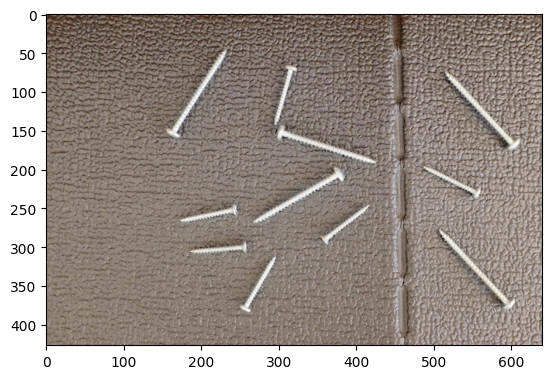

In [57]:
plt.imshow(images[2])

# 1. Traitement de l'image

## 1.1 Filtrage des images

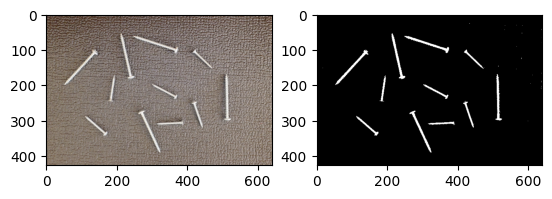

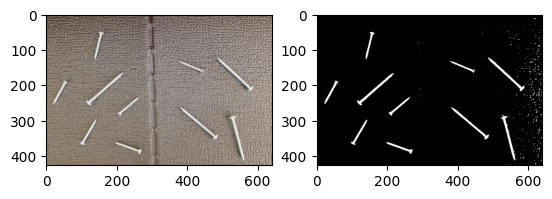

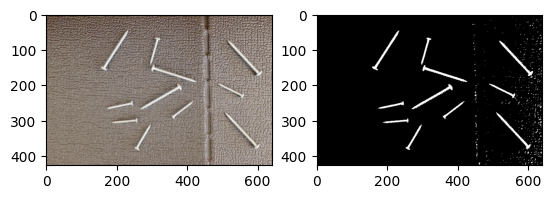

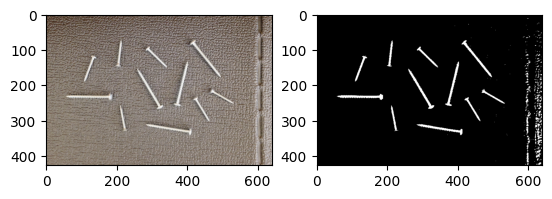

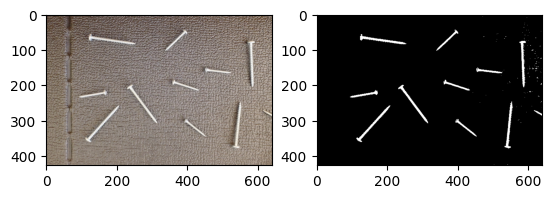

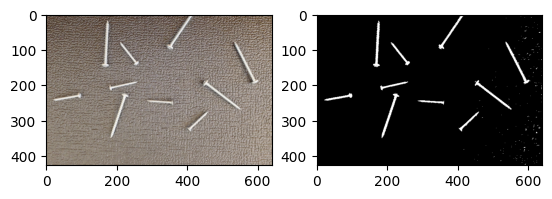

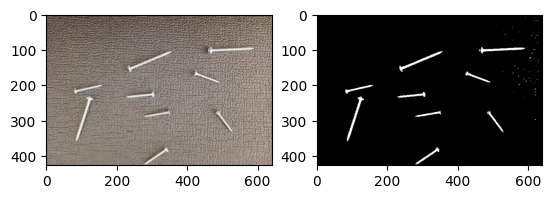

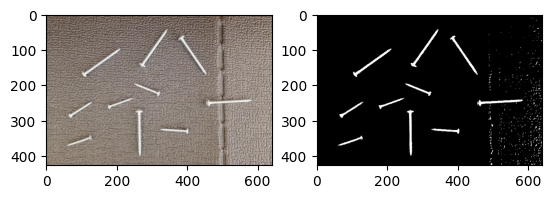

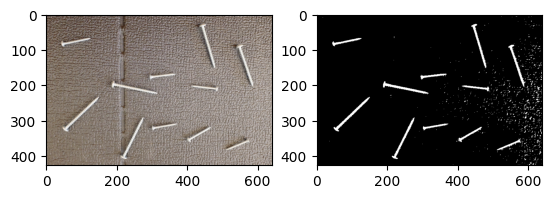

In [58]:
images_canny = []
for image in images:
    image_copy = image.copy()
    # Filtre median bilatéral :
    image_copy = cv2.bilateralFilter(image_copy, 9, 75, 75)
    # Filtre médian :
    # image_copy = cv2.medianBlur(image_copy, 9)
    # Filtre gaussien :
    # image_copy = cv2.GaussianBlur(image_copy, (5,5), 0)
    # images_canny.append(cv2.Canny(image_copy, 100, 300))
    # Conversion en HSV :
    image_copy = cv2.cvtColor(image_copy, cv2.COLOR_RGB2HSV)
    # Filtrage de la couleur argent :
    mask = cv2.inRange(image_copy, (0, 0, 180), (255, 50, 255))
    images_canny.append(mask)
# Affichage des images filtrer avec Canny :
i = 0
for image in images_canny:
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(images[i], cmap="gray")
    plt.subplot(1,2,2)
    plt.imshow(image, cmap="gray")
    i += 1


## 1.2 Trouver les contours

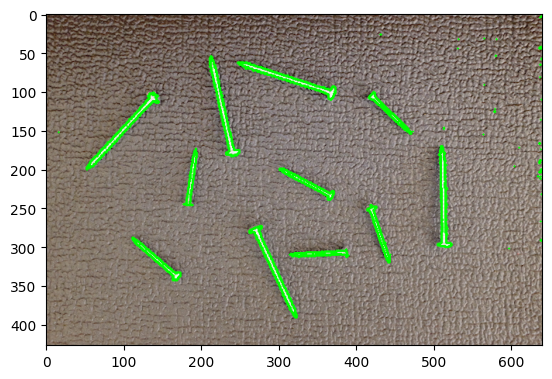

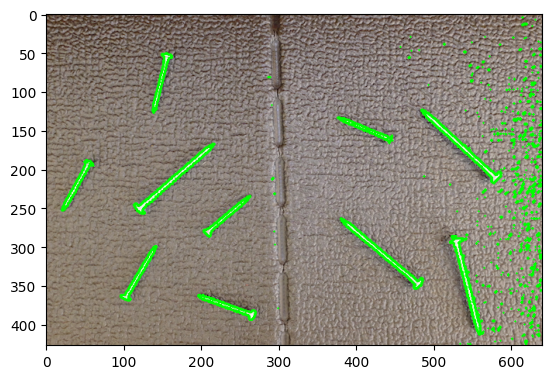

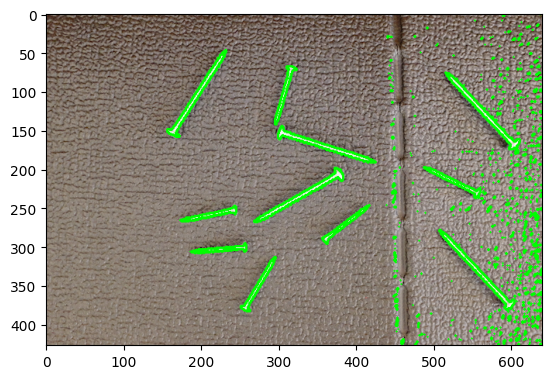

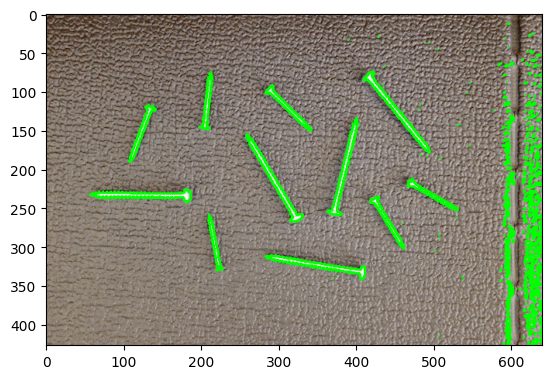

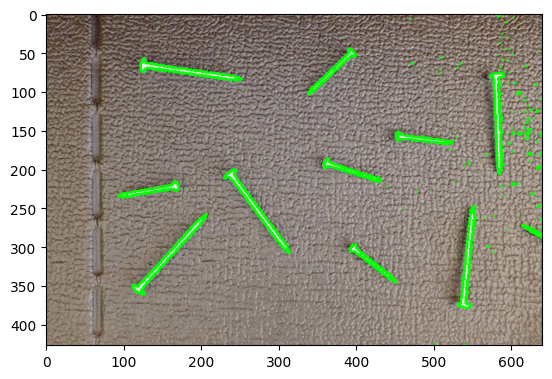

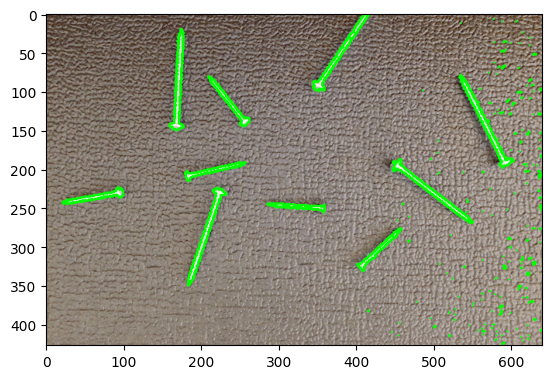

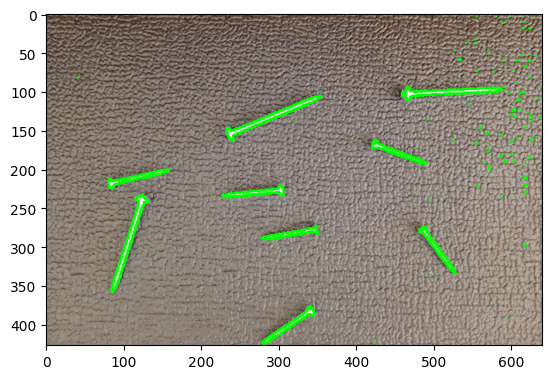

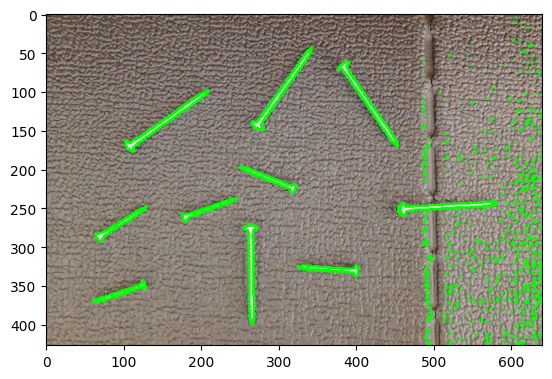

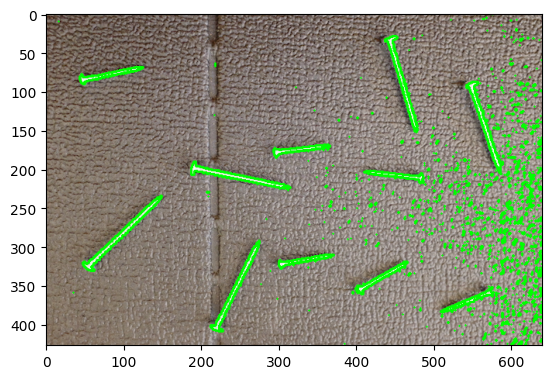

In [59]:
image_contours = []
for image in images_canny:
    contours, hierarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    image_contours.append(contours)
# Affichage des contours :
i = 0
for image, contours in zip(images, image_contours):
    image_c_copy = image.copy()
    cv2.drawContours(image_c_copy, contours, -1, (0, 255, 0), 2)
    plt.figure()
    plt.imshow(image_c_copy)
    i += 1


## 1.3. Trouver les boîtes englobantes et leurs point milieu

C:\Users\alexd\AppData\Local\Temp\ipykernel_5560\720244045.py:10: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  box = np.int0(box)
C:\Users\alexd\AppData\Local\Temp\ipykernel_5560\720244045.py:32: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Point milieu : (%i, %i), angle : %f, longueur :%s" %(xy_center[0], xy_center[1], angle, vis_type))
C:\Users\alexd\AppData\Local\Temp\ipykernel_5560\720244045.py:50: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  screws.append(np.array([xy_center[0], xy_center[1], float(angle)]))


Point milieu : (351, 308), angle : 1.987289, longueur :courte
Point milieu : (139, 316), angle : 139.226715, longueur :courte
Point milieu : (292, 334), angle : 114.996864, longueur :longue
Point milieu : (428, 284), angle : 108.238029, longueur :courte
Point milieu : (334, 218), angle : 152.304749, longueur :courte
Point milieu : (189, 210), angle : 81.928726, longueur :courte
Point milieu : (515, 235), angle : 91.414955, longueur :longue
Point milieu : (95, 150), angle : 47.322372, longueur :longue
Point milieu : (443, 129), angle : 136.053589, longueur :courte
Point milieu : (310, 80), angle : 162.130234, longueur :longue
Point milieu : (229, 117), angle : 102.802101, longueur :longue
Point milieu : (231, 377), angle : 160.163330, longueur :courte
Point milieu : (122, 334), angle : 59.476357, longueur :courte
Point milieu : (541, 351), angle : 104.238777, longueur :longue
Point milieu : (430, 309), angle : 140.118927, longueur :longue
Point milieu : (233, 257), angle : 40.409637, lo

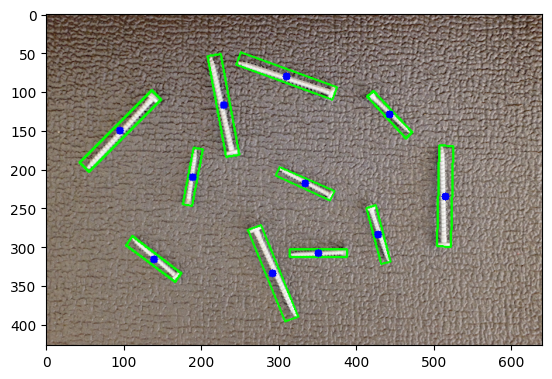

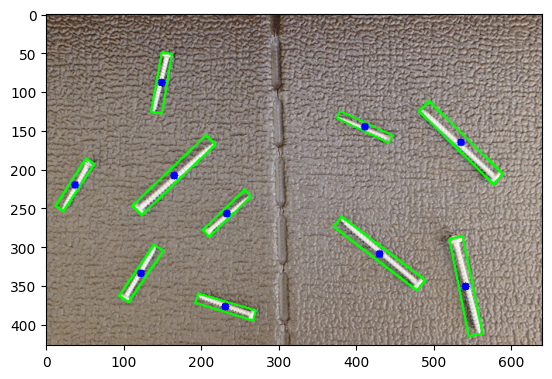

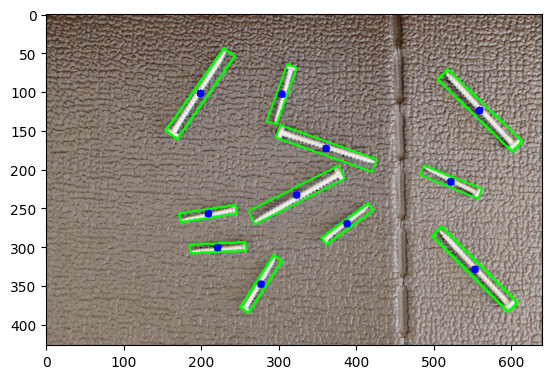

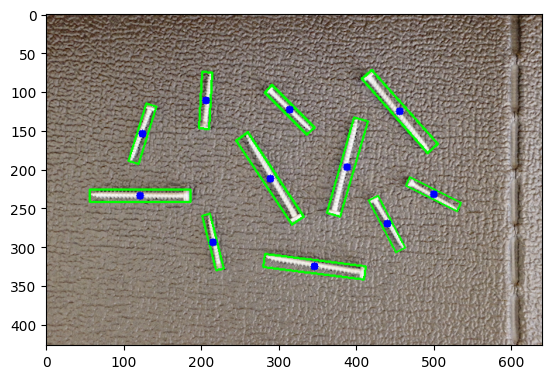

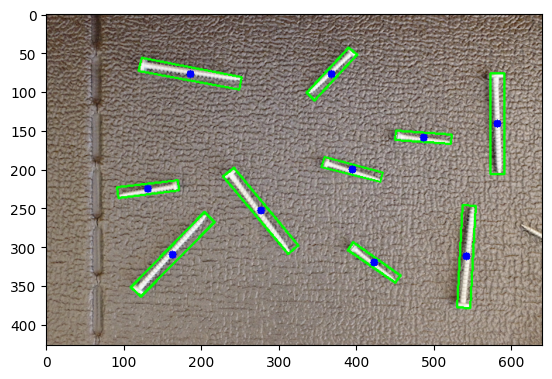

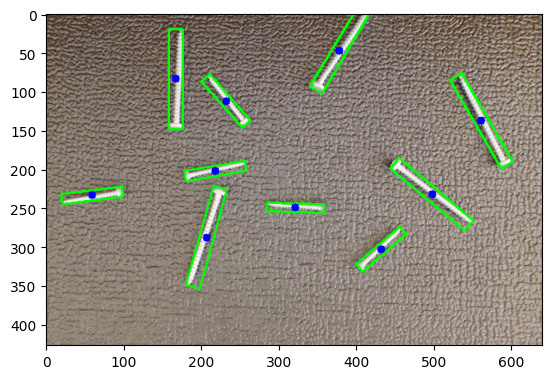

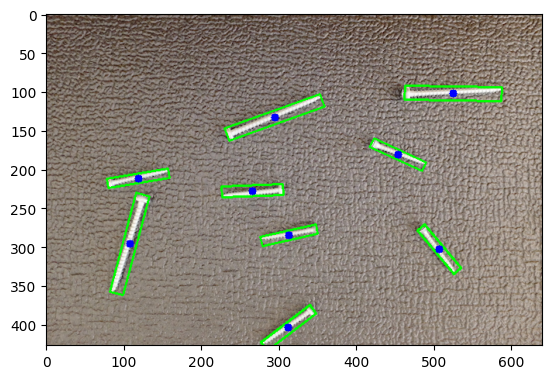

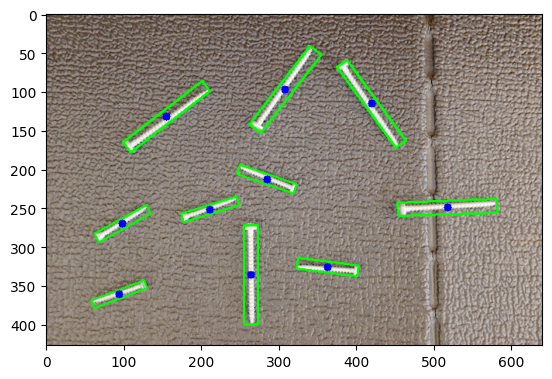

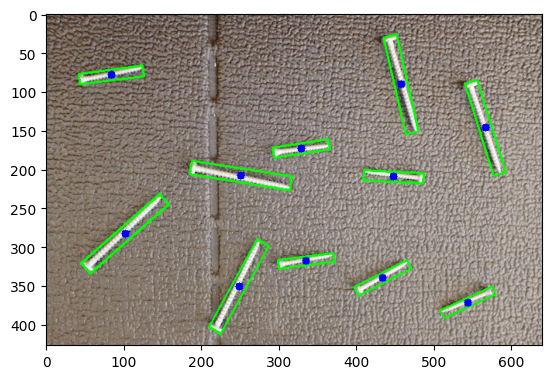

In [64]:
images_bbox_copy = images.copy()
screw_properties = dict()
image_index = 0
for image, contours in zip(images_bbox_copy, image_contours):
    screws = []
    for contour in contours:
        xy_center, wh, angle = cv2.minAreaRect(contour)
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        box = np.int0(box)
        # Affichage des boîtes englobantes :
        if wh[0]*wh[1] > 500:  # On ignore les boîtes trop petites
            # Calcul de l'angle :
            rows,cols = image.shape[:2]
            [vx,vy,x,y] = cv2.fitLine(contour, cv2.DIST_L2,0,0.01,0.01)
            # Calculate the angle using arctan2 and convert it to degrees
            angle_rad = np.arctan2(vy, vx)
            angle = np.degrees(angle_rad)

            # Make sure the angle is positive (between 0 and 180)
            if angle < 0:
                angle += 180
            angle = 180 - angle
            # Calcul de la longueur de la vis :
            longueur = max(wh)
            vis_type = "Inconnu"
            if longueur < 100:
                vis_type = "courte"
            else:
                vis_type = "longue"
            #Affichage du point milieu et de l'angle :
            print("Point milieu : (%i, %i), angle : %f, longueur :%s" %(xy_center[0], xy_center[1], angle, vis_type))
            cv2.drawContours(image, [box], 0, (0, 255, 0), 2)
            cv2.circle(image, (int(xy_center[0]), int(xy_center[1])), 5, (0, 0, 255), -1)

            # Add screw properties to list:
            screws.append(np.array([xy_center[0], xy_center[1], float(angle)]))
    screw_properties[image_index] =screws
    image_index += 1
# Affichage des images avec les boîtes englobantes :
for image in images_bbox_copy:
    plt.figure()
    plt.imshow(image)


# 2. Conversion des coordonnées des vis de pixels à métrique :

In [40]:
image_index = 0
for image in images_bbox_copy:
    Resolution = [640, 427]
    Capteur = [23.4/1000, 15.6/1000]
    wm = Capteur[0] / Resolution[0]  # m/pixel
    hm = Capteur[1] / Resolution[1]  # m/pixel
    for screw in screw_properties[image_index]:
        screw[0] = screw[0] * wm  # x_center
        screw[1] = screw[1] * hm  # y_center
    image_index += 1
# Affichage des coordonnées de la première vis de la première image :
print("x : %f m, y : %f m, angle : %f degree"%(screw_properties[0][0][0], screw_properties[0][0][1], screw_properties[0][0][2]))


x : 0.012833 m, y : 0.011252 m, angle : -0.000000 degree


# 3. Calcul de la position de la vis par rapport à la caméra :

In [41]:
Tcam = np.array([[1, 0, 0, 0.5],
                [0,-1, 0, 0.2],
                [0, 0, -1, 0.282],
                [0, 0, 0, 1]])  # Position de la caméra par rapport à la base
image_index = 0
for image in images_bbox_copy:
    for screw in screw_properties[image_index]:
        screw_vector = np.array([screw[0], screw[1], 0, 1])
        screw_vector = Tcam @ screw_vector
        screw[0] = screw_vector[0]  # x_center
        screw[1] = screw_vector[1]  # y_center
    image_index += 1
# Affichage des coordonnées de la première vis de la première image :
print("x : %f m, y : %f m, angle : %f degree"%(screw_properties[0][0][0], screw_properties[0][0][1], screw_properties[0][0][2]))

x : 0.512833 m, y : 0.188748 m, angle : -0.000000 degree
